# Описание задачи

Поздравляю вас, теперь вы вооружены знаниями по предобработке данных, и пора применить их на интересном кейсе.

Представлены данные такси, по которым мы должны предсказать возьмёт ли таксист заказ или нет(driver_response).

Принципы вы знаете, чек-лист аналогичен лабораторной работе.

Чек-лист:
1. Загрузите датасет taxi.csv.
2. Посмотрите на данные. Отобразите общую информацию по признакам (вспомните о describe и info). Напишите в markdown свои наблюдения.
3. Выявите пропуски, а также возможные причины их возникновения. Решите, что следует сделать с ними. Напишите в markdown свои наблюдения.
4. Оцените зависимости переменных между собой. Используйте корреляции. Будет хорошо, если воспользуетесь profile_report. Напишите в markdown свои наблюдения.
5. Определите стратегию преобразования категориальных признаков (т.е. как их сделать адекватными для моделей).
6. Найдите признаки, которые можно разделить на другие, или преобразовать в другой тип данных. Удалите лишние, при необходимости.
7. Разделите выборку на обучаемую и тестовую.
8. Обучите модель. Напишите в markdown свои наблюдения по полученным результатам. Хорошие результаты дают классификаторы RandomForest и XGBoost

Если возникнут затруднения, то смотрите на материал практических занятий. Данного там должно хватить для выполнения всех пунктов. Желаю успеха!

# Импорты и загрузка данных 

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import datetime
import pandas_profiling

from matplotlib import pyplot as plt
import plotly.express as px


In [2]:
data = pd.read_csv('taxi.csv')
data.head(5)

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,duration_min,offer_class_group,ride_type_desc,driver_response
0,1105373,5,20,6080,174182,55.818842,37.334562,55.814567,37.355010,-1.000,-1.000,Economy,private,0
1,759733,5,14,6080,358774,55.805342,37.515023,55.819329,37.466398,18.802,25.217,Standard,private,1
2,416977,6,14,6080,866260,55.813978,37.347688,55.814827,37.354074,6.747,9.800,Economy,private,0
3,889660,2,6,6080,163522,55.745922,37.421748,55.743469,37.431130,-1.000,-1.000,Economy,private,1
4,1120055,4,16,6080,506710,55.803578,37.521602,55.812559,37.527407,12.383,19.250,Economy,private,1


# Проверка наличия/обработка пропусков, удаление и создание признаков

In [3]:
data.shape

(100000, 14)

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 14 columns):
offer_gk                  100000 non-null int64
weekday_key               100000 non-null int64
hour_key                  100000 non-null int64
driver_gk                 100000 non-null int64
order_gk                  100000 non-null int64
driver_latitude           100000 non-null float64
driver_longitude          100000 non-null float64
origin_order_latitude     100000 non-null float64
origin_order_longitude    100000 non-null float64
distance_km               100000 non-null float64
duration_min              100000 non-null float64
offer_class_group         100000 non-null object
ride_type_desc            100000 non-null object
driver_response           100000 non-null int64
dtypes: float64(6), int64(6), object(2)
memory usage: 10.7+ MB


In [5]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
offer_gk,100000.0,566218.928650,325935.980081,4.0,285555.250000,565671.500000,848719.750000,1.130355e+06
weekday_key,100000.0,3.159860,2.054222,0.0,1.000000,3.000000,5.000000,6.000000e+00
hour_key,100000.0,13.827790,7.306496,0.0,8.000000,16.000000,20.000000,2.300000e+01
driver_gk,100000.0,3446.376360,2038.738677,14.0,1421.000000,3506.500000,5242.000000,6.806000e+03
order_gk,100000.0,460867.012910,266064.989530,18.0,229178.500000,462420.000000,690894.000000,9.203440e+05
driver_latitude,100000.0,55.700824,2.135903,-1.0,55.708651,55.772904,55.960667,5.617410e+01
driver_longitude,100000.0,37.492292,1.454640,-1.0,37.413497,37.533664,37.624113,3.828055e+01
origin_order_latitude,100000.0,55.772440,0.665985,-1.0,55.708032,55.772561,55.962000,5.631112e+01
origin_order_longitude,100000.0,37.541637,0.467758,-1.0,37.407117,37.532537,37.624358,3.824361e+01
distance_km,100000.0,18.393518,41.129296,-1.0,-1.000000,10.411500,30.665250,5.234283e+03


1. Объем данных в реальной задаче казался бы мне подозрительно ровным. 
2. Похоже, что признаки _gk - идентификаторы. Если так, то пользы от них никакой. Надо проверить распределение (а еще лучше почитать описание данных, но его нет)
3. День недели и время суток в удобном формате, пропусков нет, выбросов нет
4. Есть координаты водителя и потенциального пассажира, по ним можно рассчитать расстояние. Есть значения -1, скорее всего это пропуски и надо с ними что-то делать.
5. Длина и длительность пути есть только в случае, если driver_response = 1 (проверить), что логично. Но если это так, то значит до начала поездки водитель не знает эти параметры и они не влияют на решение брать или не брать заказ.
6. offer_class_group, ride_type_desc - категориальные переменные. преобразуем в 0/1, либо в вектора в зависимости от кол-ва принимаемых значений

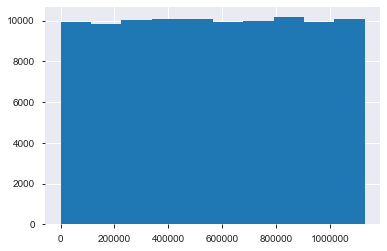

In [6]:
data.offer_gk.hist()

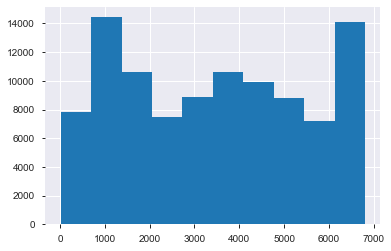

In [7]:
data.driver_gk.hist()

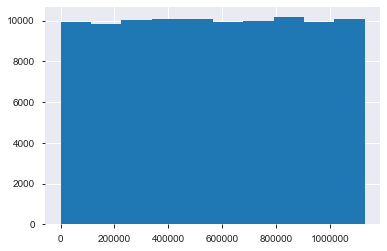

In [8]:
data.offer_gk.hist()

In [9]:
data.corr()

,offer_gk,weekday_key,hour_key,driver_gk,order_gk,driver_latitude,driver_longitude,origin_order_latitude,origin_order_longitude,distance_km,duration_min,driver_response
offer_gk,1.000000,-0.004506,-0.006948,0.001475,0.003331,-0.003075,-0.003615,-0.005472,-0.006779,-0.002370,-0.002259,0.005156
weekday_key,-0.004506,1.000000,0.047880,0.011147,0.000738,-0.000230,0.006484,-0.010530,0.010081,-0.029313,-0.030534,0.038610
hour_key,-0.006948,0.047880,1.000000,-0.037363,0.006163,0.000306,-0.006990,0.008156,-0.016224,-0.020857,-0.026189,0.019533
driver_gk,0.001475,0.011147,-0.037363,1.000000,-0.004144,-0.026871,-0.004116,-0.031577,0.042773,-0.009581,-0.004083,0.015728
order_gk,0.003331,0.000738,0.006163,-0.004144,1.000000,0.004519,0.003259,0.005538,0.001282,0.002121,0.003198,0.001663
driver_latitude,-0.003075,-0.000230,0.000306,-0.026871,0.004519,1.000000,0.986198,0.031568,-0.036470,0.010341,0.015991,-0.051948
driver_longitude,-0.003615,0.006484,-0.006990,-0.004116,0.003259,0.986198,1.000000,-0.003323,0.017067,0.013402,0.023337,-0.019828
origin_order_latitude,-0.005472,-0.010530,0.008156,-0.031577,0.005538,0.031568,-0.003323,1.000000,0.856676,-0.000900,-0.005915,-0.049377
origin_order_longitude,-0.006779,0.010081,-0.016224,0.042773,0.001282,-0.036470,0.017067,0.856676,1.000000,0.009741,0.018311,0.053248
distance_km,-0.002370,-0.029313,-0.020857,-0.009581,0.002121,0.010341,0.013402,-0.000900,0.009741,1.000000,0.977033,-0.140969


По косвенным признакам (равномерное распредление, отсутсвие корреляции с каким-лиюо из других признаков) - _gk поля не несут смысла, удалим

In [10]:
data = data.drop(columns = ['offer_gk','driver_gk','order_gk'])

In [11]:
data[(data['driver_latitude']==-1) | (data['driver_longitude']==-1)].shape
# в 140 случаях мы не знаем расположение водителя, при этом заказ может быть взят. значит удалять эти данные нельзя.

(140, 11)

In [12]:
data[(data['origin_order_latitude']==-1) | (data['origin_order_longitude']==-1)].shape
# в 13 случаях мы не знаем расположение водителя, при этом заказ может быть взят. значит удалять эти данные нельзя.

(13, 11)

In [13]:
# добавим новый признак - расстояние между водителем и потенциальным пассажиром
def get_way(X):
    x1 = X['driver_latitude']
    y1 = X['driver_longitude']
    x2 = X['origin_order_latitude']
    y2 = X['origin_order_longitude']
    return ((x2-x1)**2+(y2-y1)**2)**0.5

data['way_to_order'] = data.apply(get_way, axis = 1)

In [14]:
fig = px.box(data, y="way_to_order")
fig.show()
# на графике (выше 60) видны те строки, в которых координаты частично или полностью не были указаны. Приравняем этот признак к среднему

In [15]:
# data['way_to_order'] = data['way_to_order'].fillna(data['way_to_order'].mean)

data.loc[data['way_to_order'] > 50, 'way_to_order'] = data[data['way_to_order']<=50]['way_to_order'].mean()

In [16]:
# координаты можно убирать
data = data.drop(columns = ['driver_latitude','driver_longitude','origin_order_latitude','origin_order_longitude'])

In [17]:
data[(data['distance_km']==-1)&(data['duration_min']!=-1)].shape
# пропуски в длине поездки и длиетльности встречаются только одновременно

(0, 8)

In [18]:
data[data['distance_km']==-1].shape
# пропуски в 26% по двум признакам. Заполним средним значением

(26207, 8)

In [19]:
data.loc[data['distance_km'] == -1,'distance_km'] = data[data['distance_km']!=-1]['distance_km'].mean()
data.loc[data['duration_min'] == -1,'duration_min'] = data[data['duration_min']!=-1]['duration_min'].mean()

# Взаимосвязи между признаками

In [20]:
data.profile_report()

In [21]:
data=data.drop(columns='duration_min')

# RandomForest 1

In [22]:
cat_columns = ["offer_class_group", "ride_type_desc",'driver_response']

In [23]:
data_processed = pd.get_dummies(data, prefix_sep="__",
                              columns=cat_columns)

In [24]:
data_processed.head()

,weekday_key,hour_key,distance_km,way_to_order,offer_class_group__Delivery,offer_class_group__Economy,offer_class_group__Kids,offer_class_group__Premium,offer_class_group__Standard,offer_class_group__Test,offer_class_group__VIP,offer_class_group__VIP+,offer_class_group__XL,ride_type_desc__SMB,ride_type_desc__affiliate,ride_type_desc__business,ride_type_desc__private,driver_response__0,driver_response__1
0,5,20,25.280972,0.020890,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0
1,5,14,18.802000,0.050597,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1
2,6,14,6.747000,0.006442,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0
3,2,6,25.280972,0.009697,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1
4,4,16,12.383000,0.010694,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1


In [25]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
from sklearn.preprocessing import LabelEncoder

In [26]:
output_ = data_processed.iloc[:,17:]
input_ = data_processed.iloc[:,:17]

In [27]:
le=LabelEncoder()
targets=(output_.iloc[:,:]==1).idxmax(1)
Y=le.fit_transform(targets)

In [28]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(input_, Y, test_size=0.3)

No handles with labels found to put in legend.


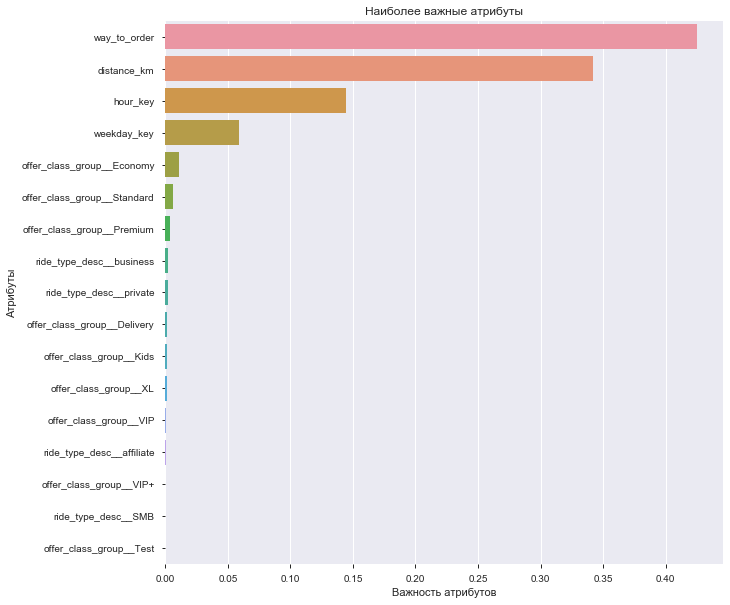

In [29]:
from sklearn.ensemble import (RandomForestClassifier, ExtraTreesClassifier,
                              AdaBoostClassifier)

# создаем модель деревья решений
model=RandomForestClassifier(n_estimators=50)

# обучаем модель
model.fit(X_train,y_train)

headers = list(X_train.columns.values)
feature_imp = pd.Series(model.feature_importances_,index=headers).sort_values(ascending=False)

f, ax = plt.subplots(figsize=(10, 10))
sns.barplot(x=feature_imp, y=feature_imp.index)

plt.xlabel('Важность атрибутов')
plt.ylabel('Атрибуты')
plt.title("Наиболее важные атрибуты")
plt.legend()
plt.show()

In [30]:
model.score(X_test, y_test)

0.6951333333333334

# RandomForest 2 - normilized input

Модель не слишком точна, всего 69.8%, попробуем номрализовать вводные. Хотя, предполагаю, что эффекта не будет.

In [31]:
from sklearn import preprocessing

cols = input_.columns

min_max_scaler = preprocessing.MinMaxScaler()
np_scaled = min_max_scaler.fit_transform(input_)
input__normalized = pd.DataFrame(np_scaled, columns = cols)
input__normalized.head()

,weekday_key,hour_key,distance_km,way_to_order,offer_class_group__Delivery,offer_class_group__Economy,offer_class_group__Kids,offer_class_group__Premium,offer_class_group__Standard,offer_class_group__Test,offer_class_group__VIP,offer_class_group__VIP+,offer_class_group__XL,ride_type_desc__SMB,ride_type_desc__affiliate,ride_type_desc__business,ride_type_desc__private
0,0.833333,0.869565,0.004830,0.064135,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0.833333,0.608696,0.003592,0.155338,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,1.000000,0.608696,0.001289,0.019778,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.333333,0.260870,0.004830,0.029772,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.666667,0.695652,0.002366,0.032831,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [32]:
X_train, X_test, y_train, y_test = train_test_split(input__normalized, Y, test_size=0.3)

model=RandomForestClassifier(n_estimators=50)

# обучаем модель
model.fit(X_train,y_train)
model.score(X_test, y_test)

0.694

# RandomForest 3 - minimal input

In [33]:
input_minimal = input_[['weekday_key','hour_key','distance_km','way_to_order','offer_class_group__Economy','ride_type_desc__private']]

In [34]:
input_minimal.head()

,weekday_key,hour_key,distance_km,way_to_order,offer_class_group__Economy,ride_type_desc__private
0,5,20,25.280972,0.020890,1,1
1,5,14,18.802000,0.050597,0,1
2,6,14,6.747000,0.006442,1,1
3,2,6,25.280972,0.009697,1,1
4,4,16,12.383000,0.010694,1,1


In [35]:
X_train, X_test, y_train, y_test = train_test_split(input_minimal, Y, test_size=0.3)

model=RandomForestClassifier(n_estimators=50)

# обучаем модель
model.fit(X_train,y_train)
model.score(X_test, y_test)

0.6946333333333333

Видим, что случайные деревья сами отсеивают лишние признаки, а также нечуствительны к нормализации.
Попробуем создать новый признак на основе дня и времени.

In [36]:
def weekend(day_key):
    if day_key<5:
        return 0
    return 1

def daytime(hour_key):
    if hour_key<6:
        return 'night'
    elif hour_key<12:
        return 'morning'
    elif hour_key<18:
        return 'noon'
    return 'evening'

def rushhour(X): #часы пик определены по данным яндекс о количестве запросов из метро по часам)
    if (X.weekend==0)&((X.hour_key>=7)&(X.hour_key<10)|(X.hour_key>=17)&(X.hour_key<21)):
        return 1
    return 0

In [37]:
data['weekend']=data['weekday_key'].apply(weekend)
data['daytime']=data['hour_key'].apply(daytime)
data['rushhour']=data.apply(rushhour, axis = 1)

In [38]:
data.head(10)

,weekday_key,hour_key,distance_km,offer_class_group,ride_type_desc,driver_response,way_to_order,weekend,daytime,rushhour
0,5,20,25.280972,Economy,private,0,0.020890,1,evening,0
1,5,14,18.802000,Standard,private,1,0.050597,1,noon,0
2,6,14,6.747000,Economy,private,0,0.006442,1,noon,0
3,2,6,25.280972,Economy,private,1,0.009697,0,morning,0
4,4,16,12.383000,Economy,private,1,0.010694,0,noon,0
5,6,15,6.747000,Economy,private,0,0.008095,1,noon,0
6,2,11,25.280972,Standard,business,1,0.005991,0,morning,0
7,5,20,1.517000,Economy,private,0,0.055239,1,evening,0
8,5,20,6.222000,Economy,private,0,0.046738,1,evening,0
9,6,7,10.410000,Economy,private,0,0.060544,1,morning,0


# RandomForest 3 - new featureas

In [39]:

cat_columns2 = ['driver_response','daytime']
data_cut = data.drop(columns=['offer_class_group','ride_type_desc','weekday_key','hour_key'])

In [40]:
data_processed2 = pd.get_dummies(data_cut, prefix_sep="__",
                              columns=cat_columns2)

In [41]:
data_processed2.head()

,distance_km,way_to_order,weekend,rushhour,driver_response__0,driver_response__1,daytime__evening,daytime__morning,daytime__night,daytime__noon
0,25.280972,0.020890,1,0,1,0,1,0,0,0
1,18.802000,0.050597,1,0,0,1,0,0,0,1
2,6.747000,0.006442,1,0,1,0,0,0,0,1
3,25.280972,0.009697,0,0,0,1,0,1,0,0
4,12.383000,0.010694,0,0,0,1,0,0,0,1


In [42]:
output_ = data_processed2[['driver_response__1','driver_response__0']]
input_ = data_processed2.drop(columns=['driver_response__1','driver_response__0'])

In [43]:
le=LabelEncoder()
targets=(output_.iloc[:,:]==1).idxmax(1)
Y=le.fit_transform(targets)

In [44]:
X_train, X_test, y_train, y_test = train_test_split(input_, Y, test_size=0.3)

No handles with labels found to put in legend.


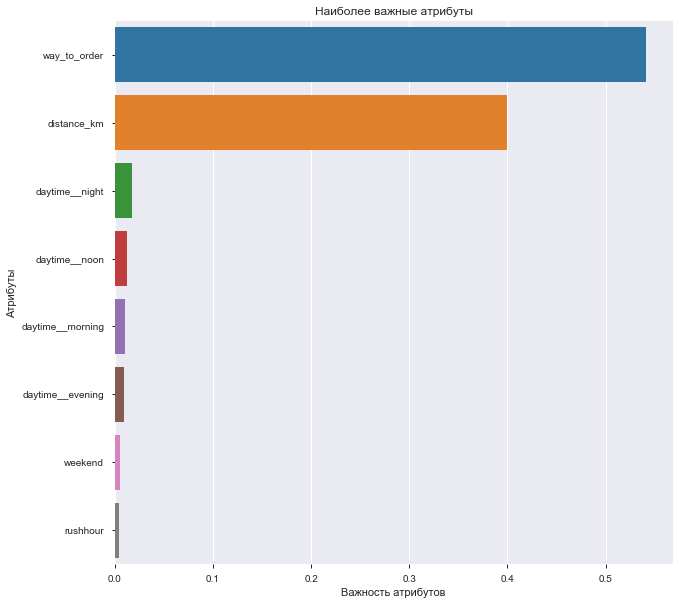

0.6702666666666667

In [45]:
model=RandomForestClassifier(n_estimators=50)

# обучаем модель
model.fit(X_train,y_train)

headers = list(X_train.columns.values)
feature_imp = pd.Series(model.feature_importances_,index=headers).sort_values(ascending=False)

f, ax = plt.subplots(figsize=(10, 10))
sns.barplot(x=feature_imp, y=feature_imp.index)

plt.xlabel('Важность атрибутов')
plt.ylabel('Атрибуты')
plt.title("Наиболее важные атрибуты")
plt.legend()
plt.show()
model.score(X_test, y_test)

К сожалению, не удалось улучшить качество за счет создания признаков времени суток и признака часа-пик. В итоге лучший результат для randomforest удалось добиться без отсеивания лишних признаков, без нормализации и без создания новых. Видимо, нужно пробовать создавать прочие разные признаки или попробовать использовать другую модель. 

# XGBoost

In [46]:
import xgboost
from sklearn.metrics import accuracy_score

In [47]:
cat_columns3 = ['offer_class_group','ride_type_desc','daytime','driver_response']
data_processed3 = pd.get_dummies(data, prefix_sep="__",
                              columns=cat_columns3)

In [48]:
min_max_scaler = preprocessing.MinMaxScaler((-1,1))
data_processed3_scaled = min_max_scaler.fit_transform(data_processed3)

data_processed3_normalized = pd.DataFrame(data_processed3_scaled, columns = data_processed3.columns)
data_processed3_normalized.head()

,weekday_key,hour_key,distance_km,way_to_order,weekend,rushhour,offer_class_group__Delivery,offer_class_group__Economy,offer_class_group__Kids,offer_class_group__Premium,...,ride_type_desc__SMB,ride_type_desc__affiliate,ride_type_desc__business,ride_type_desc__private,daytime__evening,daytime__morning,daytime__night,daytime__noon,driver_response__0,driver_response__1
0,0.666667,0.739130,-0.990340,-0.871730,1.0,-1.0,-1.0,1.0,-1.0,-1.0,...,-1.0,-1.0,-1.0,1.0,1.0,-1.0,-1.0,-1.0,1.0,-1.0
1,0.666667,0.217391,-0.992816,-0.689325,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,...,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,1.0,-1.0,1.0
2,1.000000,0.217391,-0.997422,-0.960444,1.0,-1.0,-1.0,1.0,-1.0,-1.0,...,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,1.0,1.0,-1.0
3,-0.333333,-0.478261,-0.990340,-0.940456,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,...,-1.0,-1.0,-1.0,1.0,-1.0,1.0,-1.0,-1.0,-1.0,1.0
4,0.333333,0.391304,-0.995269,-0.934338,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,...,-1.0,-1.0,-1.0,1.0,-1.0,-1.0,-1.0,1.0,-1.0,1.0


In [49]:
output_ = data_processed3_normalized[['driver_response__1','driver_response__0']]
input_ = data_processed3_normalized.drop(columns=['driver_response__1','driver_response__0'])

In [50]:
le=LabelEncoder()
targets=(output_.iloc[:,:]==1).idxmax(1)
Y=le.fit_transform(targets)

In [51]:
X_train, X_test, y_train, y_test = train_test_split(input_, Y, test_size=0.3)

In [52]:
model = xgboost.XGBClassifier()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
predictions = [round(value) for value in y_pred]

accuracy = accuracy_score(y_test, predictions)

In [53]:
accuracy

0.7037333333333333

Поробуем улучшить модель за счет удаления признаков, которые не несут пользы (редкие категориальные признаки и признаки, которые явно имеют дисбаланс классов внутри себя)

In [54]:
input_cut = input_[['weekday_key', 'hour_key', 'distance_km', 'way_to_order', 'offer_class_group__Economy']]

In [55]:
X_train, X_test, y_train, y_test = train_test_split(input_cut, Y, test_size=0.3)

In [56]:
model = xgboost.XGBClassifier()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
predictions = [round(value) for value in y_pred]

accuracy = accuracy_score(y_test, predictions)

In [57]:
accuracy

0.7043666666666667

#### Максимальная точность, которой удалось добиться - 70.5%